In [1]:
import pandas as pd

# Load the combined_matches.csv file and the heroes.csv file
combined_matches = pd.read_csv(r'C:\Users\shakt\anaconda3\envs\info6105\Project\MatchData\combined_matchesa2i.csv')
heroes = pd.read_csv(r'C:\Users\shakt\anaconda3\envs\info6105\Project\Data2\heroes.csv')

# Convert the radiant_team column from a string representation to a list of hero IDs
combined_matches['radiant_team'] = combined_matches['radiant_team'].apply(lambda x: [int(hero_id) for hero_id in x.strip('[]').split(',')])

# Convert the dire_team column from a string representation to a list of hero IDs
combined_matches['dire_team'] = combined_matches['dire_team'].apply(lambda x: [int(hero_id) for hero_id in x.strip('[]').split(',')])

# # Create a dictionary to map hero IDs to their roles
hero_roles = dict(zip(heroes['id'], heroes['roles']))
for k,v in hero_roles.items():
    hero_roles[k] = eval(v)

# Define a function to count the roles for a given team
def count_roles(team):
    role_count = dict.fromkeys(['Carry', 'Disabler', 'Durable', 'Escape', 'Initiator', 'Jungler', 'Nuker', 'Pusher', 'Support'], 0)
    for hero_id in team:
        roles = hero_roles.get(hero_id, [])# Use .get() method to handle missing hero IDs
        if isinstance(roles, list):  # Check if roles is a list
            for role in roles:
                
                role_count[role] += 1
    return role_count

# # Apply the count_roles function to the radiant_team column and assign the results to a new column called radiant_team_roles
combined_matches['radiant_team_roles'] = combined_matches['radiant_team'].apply(count_roles)
print(combined_matches['radiant_team_roles'])
# # Apply the count_roles function to the dire_team column and assign the results to a new column called dire_team_roles
combined_matches['dire_team_roles'] = combined_matches['dire_team'].apply(count_roles)

# # Extract the role counts as separate columns for the radiant team
combined_matches[['r_carry', 'r_disabler', 'r_durable', 'r_escape', 'r_initiator', 'r_jungler', 'r_nuker', 'r_pusher', 'r_support']] = pd.DataFrame(combined_matches['radiant_team_roles'].tolist(), index=combined_matches.index)

# # Extract the role counts as separate columns for the dire team
combined_matches[['d_carry', 'd_disabler', 'd_durable', 'd_escape', 'd_initiator', 'd_jungler', 'd_nuker', 'd_pusher', 'd_support']] = pd.DataFrame(combined_matches['dire_team_roles'].tolist(), index=combined_matches.index)

# # Drop the radiant_team_roles and dire_team_roles columns
combined_matches.drop(['radiant_team_roles', 'dire_team_roles'], axis=1, inplace=True)

# # Save the updated combined_matches.csv file
combined_matches.to_csv('combined_matchesa2iroles.csv', index=False)

0       {'Carry': 3, 'Disabler': 2, 'Durable': 2, 'Esc...
1       {'Carry': 3, 'Disabler': 4, 'Durable': 3, 'Esc...
2       {'Carry': 4, 'Disabler': 2, 'Durable': 4, 'Esc...
3       {'Carry': 3, 'Disabler': 4, 'Durable': 2, 'Esc...
4       {'Carry': 3, 'Disabler': 2, 'Durable': 0, 'Esc...
                              ...                        
4995    {'Carry': 4, 'Disabler': 3, 'Durable': 3, 'Esc...
4996    {'Carry': 4, 'Disabler': 5, 'Durable': 3, 'Esc...
4997    {'Carry': 2, 'Disabler': 4, 'Durable': 2, 'Esc...
4998    {'Carry': 3, 'Disabler': 4, 'Durable': 1, 'Esc...
4999    {'Carry': 4, 'Disabler': 3, 'Durable': 2, 'Esc...
Name: radiant_team_roles, Length: 5000, dtype: object


In [3]:
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.tree import DecisionTreeClassifier, plot_tree, export_text
from sklearn import preprocessing
import matplotlib.pyplot as plt
from sklearn.datasets import load_iris
import seaborn as sns
import numpy as np
from sklearn.ensemble import AdaBoostClassifier


# Load the updated combined_matches2.csv file
combined_matches = pd.read_csv('combined_matchesa2iroles1.csv')
combined_matches.head()


,match_id,match_seq_num,radiant_win,start_time,duration,avg_mmr,num_mmr,lobby_type,game_mode,avg_rank_tier,...,r_support,d_carry,d_disabler,d_durable,d_escape,d_initiator,d_jungler,d_nuker,d_pusher,d_support
0,7406139109,6234338341,True,1698599609,13.983333,4361.0,4.0,7,22,81,...,1,3,4,3,2,3,0,2,1,2
1,7406127904,6234337415,True,1698599168,20.016667,4586.0,2.0,7,22,81,...,1,3,5,2,1,2,0,4,0,3
2,7406124902,6234336785,True,1698599053,21.266667,5288.0,2.0,7,22,81,...,2,2,4,3,3,3,0,2,0,3
3,7406119910,6234324723,False,1698598858,17.633333,5000.0,1.0,7,22,74,...,3,3,3,3,3,3,0,2,1,1
4,7406117516,6234339523,False,1698598773,26.633333,3687.0,2.0,7,22,81,...,1,3,5,3,3,3,0,3,1,2


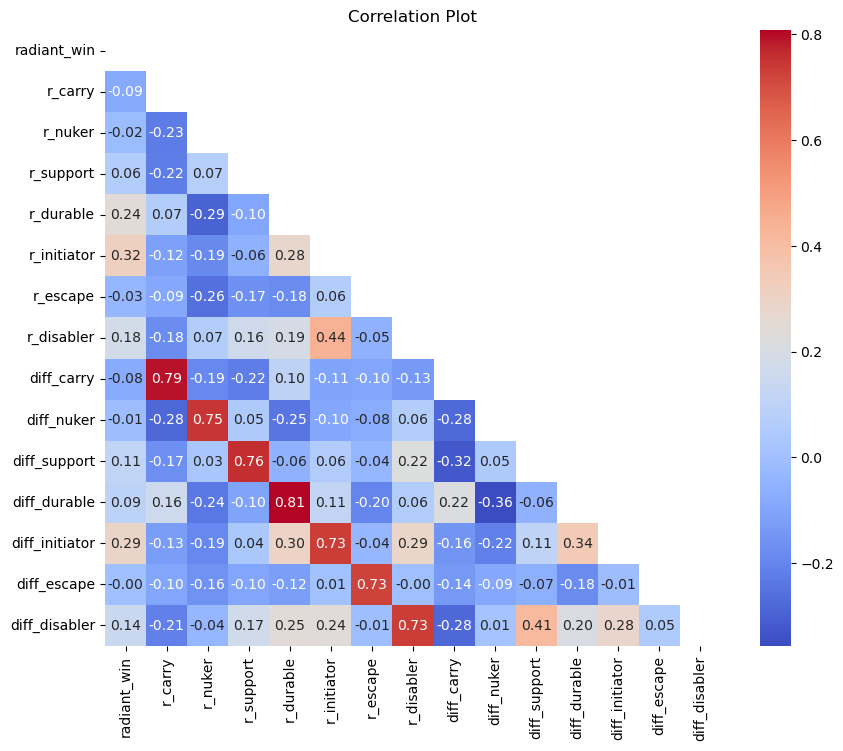

In [4]:
# Calculate the total number of radiant heroes in each role
combined_matches['total_r_carry'] = combined_matches['r_carry']
combined_matches['total_r_nuker'] = combined_matches['r_nuker']
combined_matches['total_r_support'] = combined_matches['r_support']
combined_matches['total_r_durable'] = combined_matches['r_durable']
combined_matches['total_r_initiator'] = combined_matches['r_initiator']
combined_matches['total_r_escape'] = combined_matches['r_escape']
combined_matches['total_r_disabler'] = combined_matches['r_disabler']

# Calculate the total number of dire heroes in each role
combined_matches['total_d_carry'] = combined_matches['d_carry']
combined_matches['total_d_nuker'] = combined_matches['d_nuker']
combined_matches['total_d_support'] = combined_matches['d_support']
combined_matches['total_d_durable'] = combined_matches['d_durable']
combined_matches['total_d_initiator'] = combined_matches['d_initiator']
combined_matches['total_d_escape'] = combined_matches['d_escape']
combined_matches['total_d_disabler'] = combined_matches['d_disabler']

# Calculate the difference in hero count between radiant and dire in each role
combined_matches['diff_carry'] = combined_matches['r_carry'] - combined_matches['d_carry']
combined_matches['diff_nuker'] = combined_matches['r_nuker'] - combined_matches['d_nuker']
combined_matches['diff_support'] = combined_matches['r_support'] - combined_matches['d_support']
combined_matches['diff_durable'] = combined_matches['r_durable'] - combined_matches['d_durable']
combined_matches['diff_initiator'] = combined_matches['r_initiator'] - combined_matches['d_initiator']
combined_matches['diff_escape'] = combined_matches['r_escape'] - combined_matches['d_escape']
combined_matches['diff_disabler'] = combined_matches['r_disabler'] - combined_matches['d_disabler']


z = combined_matches[['radiant_win','r_carry','r_nuker','r_support','r_durable','r_initiator','r_escape','r_disabler','diff_carry','diff_nuker','diff_support','diff_durable','diff_initiator','diff_escape','diff_disabler']]
# Perform correlation analysis
correlation_matrix = z.corr()

mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Create a correlation plot
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", square=True, mask=mask)
plt.title('Correlation Plot')
plt.show()


{'criterion': 'gini', 'max_depth': 4, 'max_features': None}
total_r_carry: 0.10323964180507639
total_r_nuker: 0.16882412621948412
total_r_support: 0.0847725593109538
total_r_durable: 0.3295495196445875
total_r_initiator: 0.31361415301989826
total_r_escape: 0.0
total_r_disabler: 0.0
Accuracy: 0.776


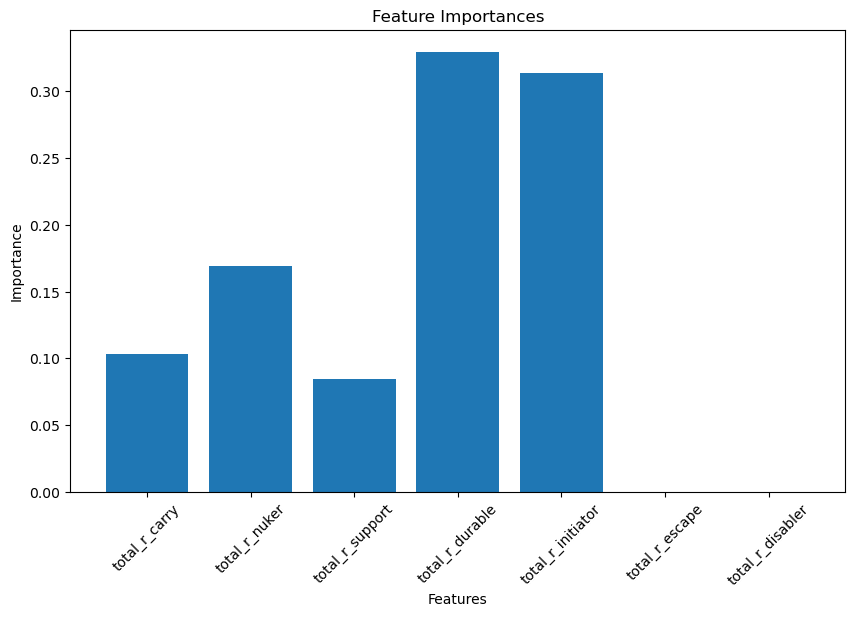

In [14]:
# Split the data into X (features) and y (target variable)
X = combined_matches[['total_r_carry', 'total_r_nuker', 'total_r_support', 'total_r_durable', 'total_r_initiator', 'total_r_escape', 'total_r_disabler']]
y = combined_matches['radiant_win']

# Perform label encoding on the target variable
le = preprocessing.LabelEncoder()
y = le.fit_transform(y)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# Define a parameter grid for hyperparameter tuning
param_grid = {
    'max_depth': [3, 4],
    'criterion': ['gini', 'entropy', 'log_loss'],
    'max_features': [None, 'sqrt', 'log2'],
}

# Perform grid search for hyperparameter tuning
grid_search = GridSearchCV(DecisionTreeClassifier(), param_grid, cv=5)
grid_search.fit(X_train, y_train)

# Get the best hyperparameters found
best_params = grid_search.best_params_
print(best_params)

# Train the decision tree classifier with the best hyperparameters
classifier = DecisionTreeClassifier(**best_params)
classifier.fit(X_train, y_train)

# Print the feature importances
importances = classifier.feature_importances_
features = X.columns

for feature, importance in zip(features, importances):
    print(f"{feature}: {importance}")

# Make predictions on the testing set
y_pred = classifier.predict(X_test)


# Evaluate the model
accuracy = classifier.score(X_test, y_test)
print("Accuracy:", accuracy)


# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.bar(features, importances)
plt.xticks(rotation=45)
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importances')
plt.show()

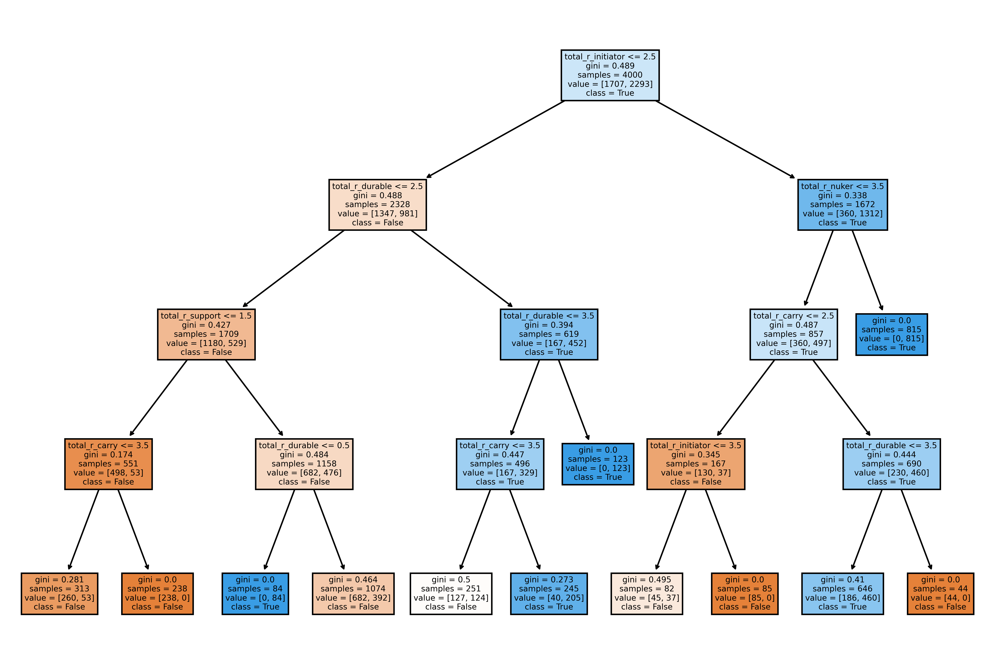

In [15]:
# Plot the decision tree
plt.figure(figsize=(12, 8), dpi=675)
plot_tree(classifier, feature_names=features, class_names=['False', 'True'], filled=True)
plt.show()


{'criterion': 'gini', 'max_depth': 4, 'max_features': None}
diff_carry: 0.04837623323488076
diff_nuker: 0.13390697324359996
diff_support: 0.3578276878696454
diff_durable: 0.18833096583379072
diff_initiator: 0.19326095709746738
diff_escape: 0.0
diff_disabler: 0.07829718272061573
Accuracy: 0.76


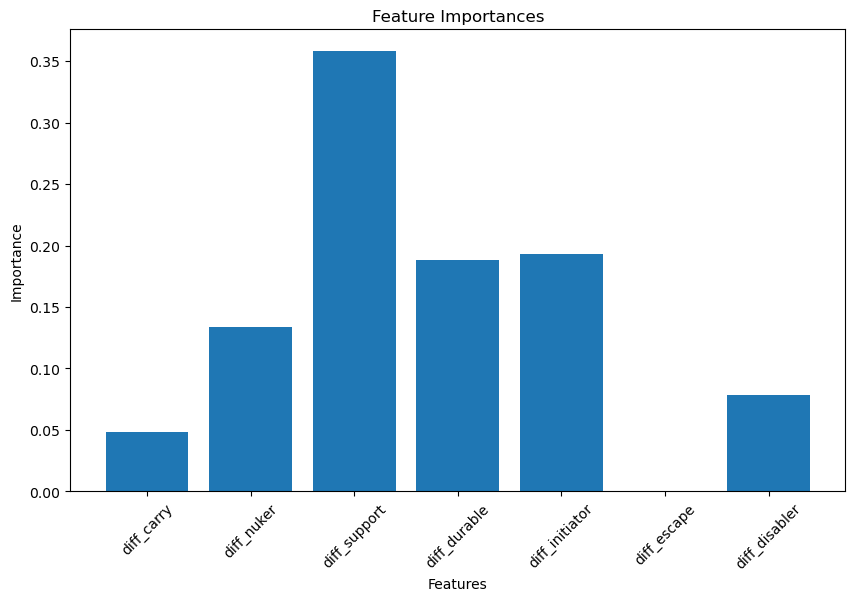

In [23]:

X = combined_matches[['diff_carry', 'diff_nuker', 'diff_support', 'diff_durable', 'diff_initiator', 'diff_escape', 'diff_disabler']]
y = combined_matches['radiant_win']

# Perform label encoding on the target variable
le = preprocessing.LabelEncoder()
y = le.fit_transform(y)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# Define a parameter grid for hyperparameter tuning
param_grid = {
    'max_depth': [3, 4],
    'criterion': ['gini', 'entropy', 'log_loss'],
    'max_features': [None, 'sqrt', 'log2'],
}

# Perform grid search for hyperparameter tuning
grid_search = GridSearchCV(DecisionTreeClassifier(), param_grid, cv=5)
grid_search.fit(X_train, y_train)

# Get the best hyperparameters found
best_params = grid_search.best_params_
print(best_params)

# Train the decision tree classifier with the best hyperparameters
classifier = DecisionTreeClassifier(**best_params)
classifier.fit(X_train, y_train)

# Print the feature importances
importances = classifier.feature_importances_
features = X.columns

for feature, importance in zip(features, importances):
    print(f"{feature}: {importance}")

# Make predictions on the testing set
y_pred = classifier.predict(X_test)

# Evaluate the model
accuracy = classifier.score(X_test, y_test)
print("Accuracy:", accuracy)

# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.bar(features, importances)
plt.xticks(rotation=45)
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importances')
plt.show()


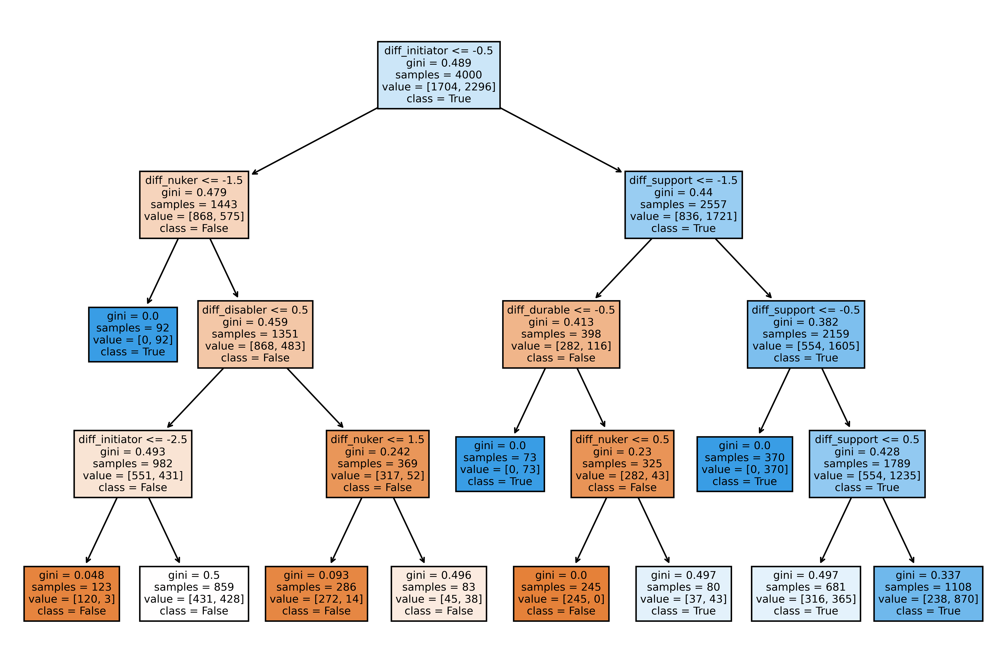

In [17]:
# Plot the decision tree
plt.figure(figsize=(12, 8), dpi=675)
plot_tree(classifier, feature_names=features, class_names=['False', 'True'], filled=True)
plt.show()

plt.figure(figsize=(24, 16), dpi=675)
plot_tree(classifier, feature_names=features, class_names=['False', 'True'], filled=True, impurity=False, rounded=True, precision=2, proportion=True, node_ids=True, label='root', fontsize=12)
plt.show()




Best Hyperparameters: {'learning_rate': 0.1, 'n_estimators': 50}
Cross-validation scores: [1.    1.    1.    1.    0.997]
Average cross-validation score: 0.9994
Accuracy with AdaBoost: 0.999


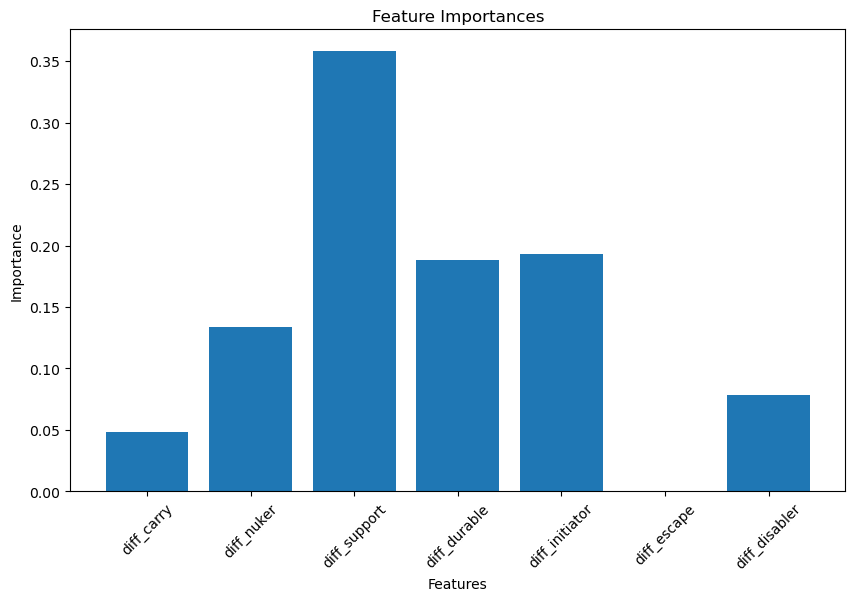

In [24]:
# Define a parameter grid for hyperparameter tuning
param_grid = {
    'n_estimators': [50, 100, 150],
    'learning_rate': [0.1, 0.5, 1.0]
}

# Create AdaBoostClassifier
adaboost = AdaBoostClassifier(base_estimator=DecisionTreeClassifier())

# Perform grid search for hyperparameter tuning
grid_search = GridSearchCV(adaboost, param_grid, cv=5)
grid_search.fit(X_train, y_train)

# Get the best hyperparameters found
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)


# Perform cross-validation on AdaBoostClassifier
scores = cross_val_score(adaboost, X, y, cv=5)
print("Cross-validation scores:", scores)
print("Average cross-validation score:", np.mean(scores))

adaboost = AdaBoostClassifier(base_estimator=DecisionTreeClassifier(criterion='gini', max_depth=4, max_features= None), **best_params)
adaboost.fit(X_train, y_train)


# Make predictions on the testing set with AdaBoostClassifier
y_pred_adaboost = adaboost.predict(X_test)

# Evaluate the AdaBoostClassifier
accuracy_adaboost = adaboost.score(X_test, y_test)
print("Accuracy with AdaBoost:", accuracy_adaboost)

# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.bar(features, importances)
plt.xticks(rotation=45)
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importances')
plt.show()

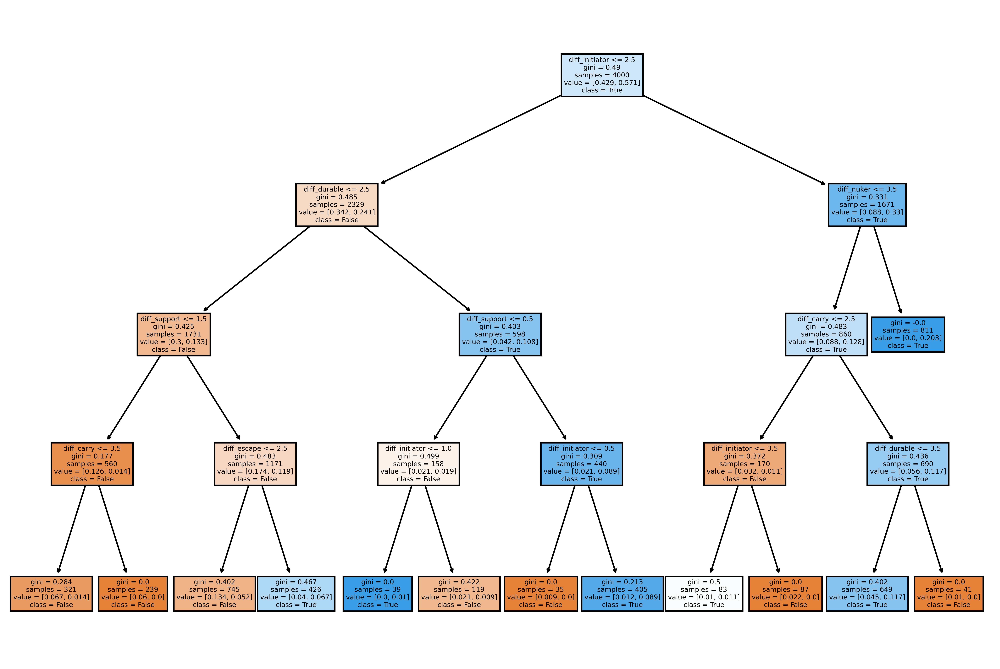

In [128]:
# Plot the decision tree with AdaBoost
plt.figure(figsize=(12,8), dpi=675)
plot_tree(adaboost.estimators_[0], feature_names=features, class_names=['False', 'True'], filled=True)
plt.show()
plt.figure(figsize=(36, 24), dpi=675)
plot_tree(adaboost.estimators_[0], feature_names=features, class_names=['False', 'True'], filled=True,impurity=False, rounded=True, precision=2, proportion=True, node_ids=True, label='root', fontsize=12)
plt.show()

In [32]:
combined_matches['game_phase'] = pd.cut(combined_matches['duration'], bins=[0, 50, 60, np.inf], labels=['early', 'mid', 'late'], right=False)

Accuracy: 1.0


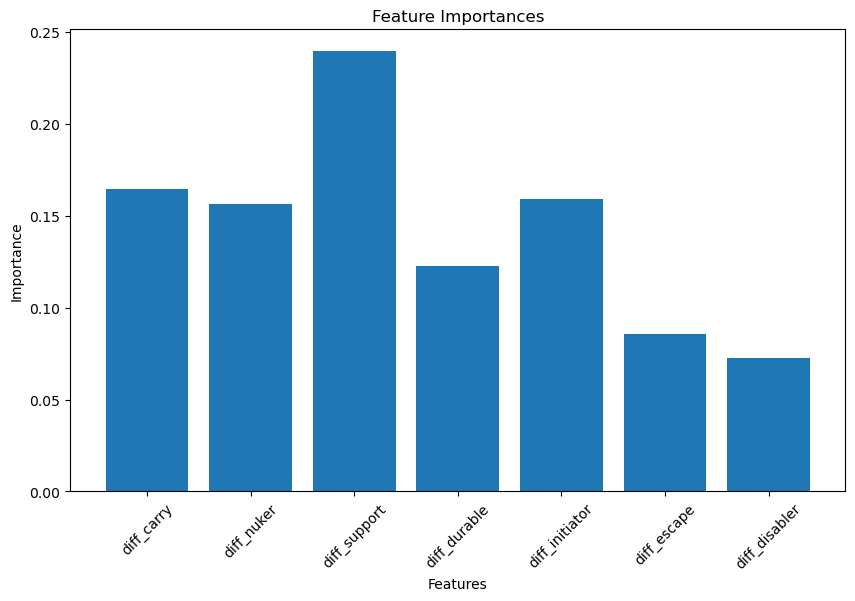

In [33]:
X = combined_matches[['diff_carry', 'diff_nuker', 'diff_support', 'diff_durable', 'diff_initiator', 'diff_escape', 'diff_disabler']]
y = combined_matches['game_phase']
le = preprocessing.LabelEncoder()
y = le.fit_transform(y)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)
classifier = DecisionTreeClassifier()
classifier.fit(X_train, y_train)
y_pred = classifier.predict(X_test)
accuracy = classifier.score(X_test, y_test)
print("Accuracy:", accuracy)
importances = classifier.feature_importances_
plt.figure(figsize=(10, 6))
plt.bar(X.columns, importances)
plt.xticks(rotation=45)
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importances')
plt.show()




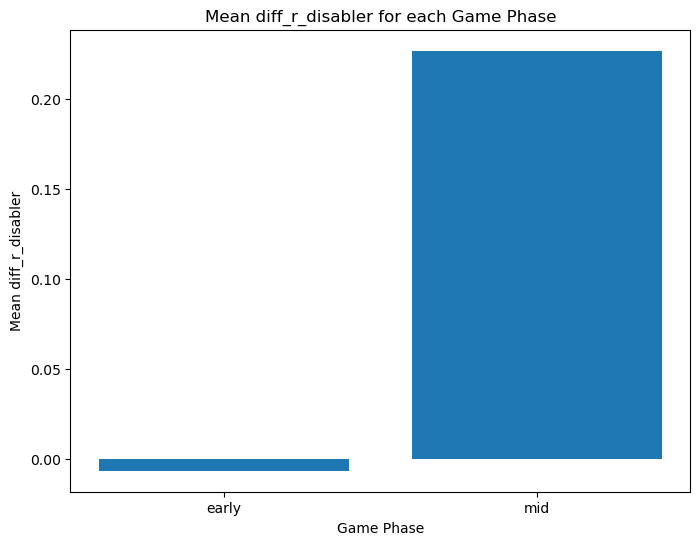

In [34]:
df = combined_matches[['diff_disabler', 'game_phase']]
phase_mean = df.groupby('game_phase')['diff_disabler'].mean()
plt.figure(figsize=(8, 6))
plt.bar(phase_mean.index, phase_mean.values)
plt.xlabel('Game Phase')
plt.ylabel('Mean diff_r_disabler')
plt.title('Mean diff_r_disabler for each Game Phase')
plt.show()


In [35]:
early_phase = combined_matches[combined_matches['game_phase'] == 'early']
mid_phase = combined_matches[combined_matches['game_phase'] == 'mid']
late_phase = combined_matches[combined_matches['game_phase'] == 'late']



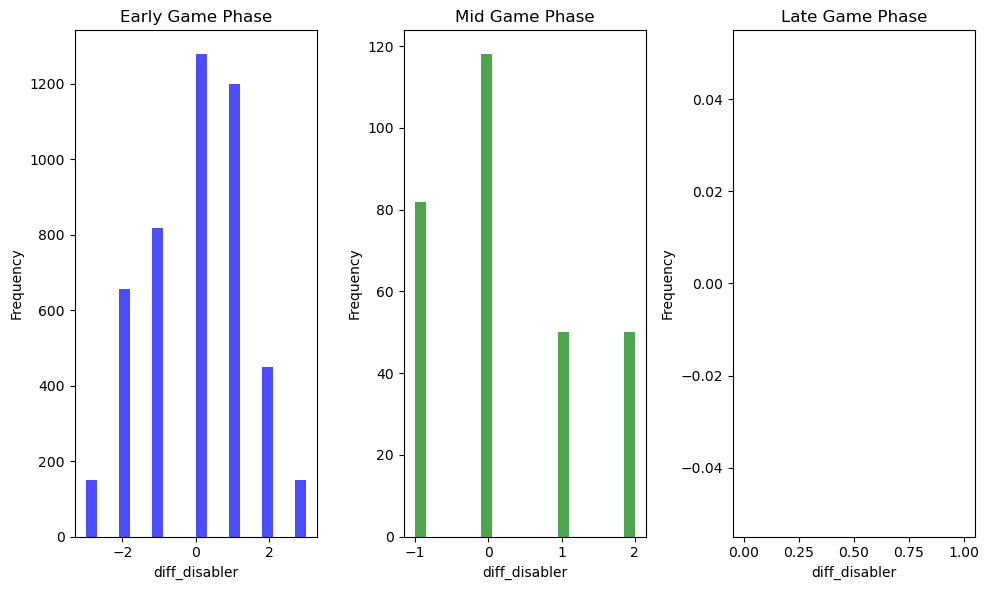

In [36]:
early_phase = combined_matches[combined_matches['game_phase'] == 'early']
mid_phase = combined_matches[combined_matches['game_phase'] == 'mid']
late_phase = combined_matches[combined_matches['game_phase'] == 'late']
plt.figure(figsize=(10, 6))
plt.subplot(1, 3, 1)
plt.hist(early_phase['diff_disabler'], bins=20, color='blue', alpha=0.7)
plt.xlabel('diff_disabler')
plt.ylabel('Frequency')
plt.title('Early Game Phase')
plt.subplot(1, 3, 2)
plt.hist(mid_phase['diff_disabler'], bins=20, color='green', alpha=0.7)
plt.xlabel('diff_disabler')
plt.ylabel('Frequency')
plt.title('Mid Game Phase')
plt.subplot(1, 3, 3)
plt.hist(late_phase['diff_disabler'], bins=20, color='red', alpha=0.7)
plt.xlabel('diff_disabler')
plt.ylabel('Frequency')
plt.title('Late Game Phase')
plt.tight_layout()
plt.show()
   

 

{'criterion': 'gini', 'max_depth': 4, 'max_features': None}
total_r_carry: 0.04752666661891999
total_r_nuker: 0.2329444766090093
total_r_support: 0.07953708748009494
total_r_durable: 0.2533089202424711
total_r_initiator: 0.30891393242976356
total_r_escape: 0.07776891661974113
total_r_disabler: 0.0
Accuracy: 0.782


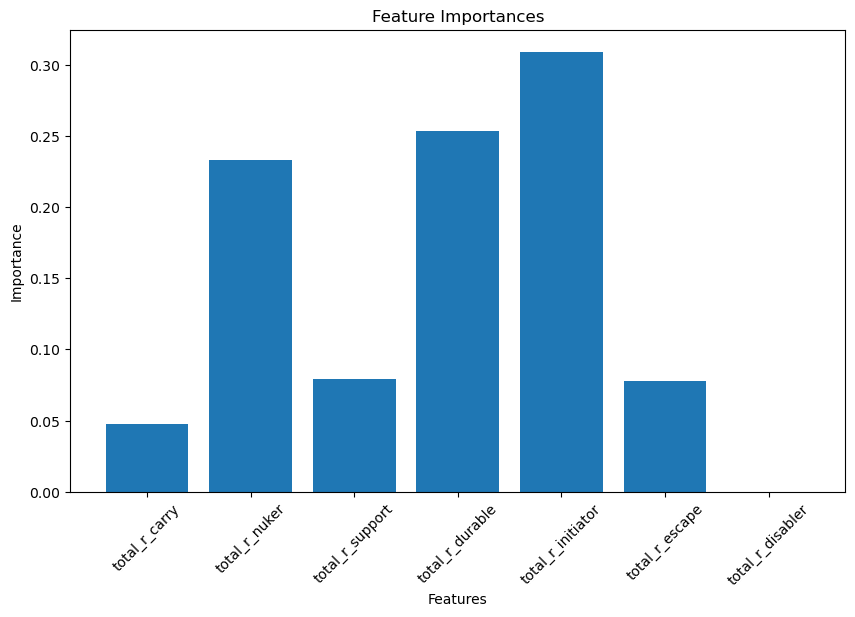

In [37]:
# Split the data into X (features) and y (target variable)
X = combined_matches[['total_r_carry', 'total_r_nuker', 'total_r_support', 'total_r_durable', 'total_r_initiator', 'total_r_escape', 'total_r_disabler']]
y = combined_matches['radiant_win']

# Perform label encoding on the target variable
le = preprocessing.LabelEncoder()
y = le.fit_transform(y)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# Define a parameter grid for hyperparameter tuning
param_grid = {
    'max_depth': [3, 4],
    'criterion': ['gini', 'entropy', 'log_loss'],
    'max_features': [None, 'sqrt', 'log2'],
}

# Perform grid search for hyperparameter tuning
grid_search = GridSearchCV(DecisionTreeClassifier(), param_grid, cv=5)
grid_search.fit(X_train, y_train)

# Get the best hyperparameters found
best_params = grid_search.best_params_
print(best_params)

# Train the decision tree classifier with the best hyperparameters
classifier = DecisionTreeClassifier(**best_params)
classifier.fit(X_train, y_train)

# Print the feature importances
importances = classifier.feature_importances_
features = X.columns

for feature, importance in zip(features, importances):
    print(f"{feature}: {importance}")

# Make predictions on the testing set
y_pred = classifier.predict(X_test)


# Evaluate the model
accuracy = classifier.score(X_test, y_test)
print("Accuracy:", accuracy)


# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.bar(features, importances)
plt.xticks(rotation=45)
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importances')
plt.show()

Random Forest Accuracy: 0.986


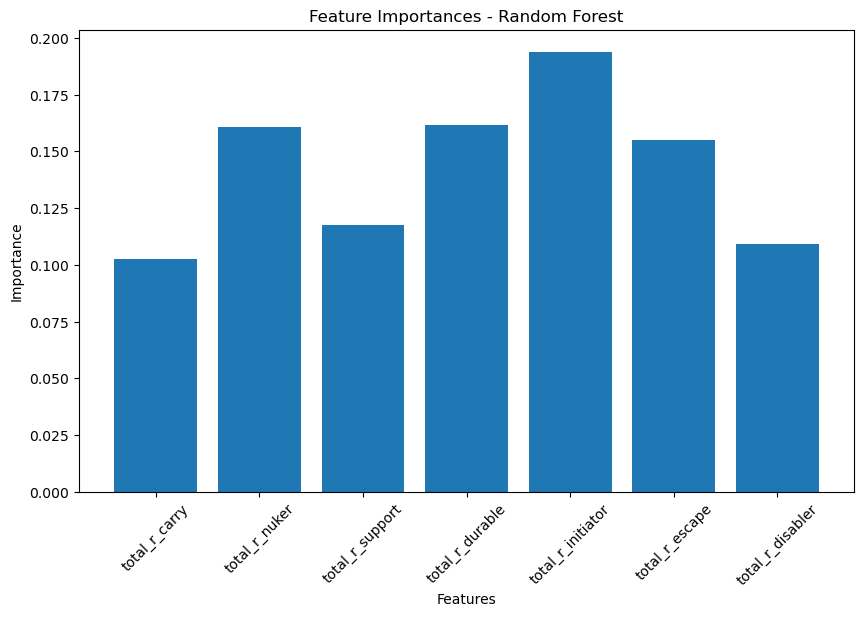

In [38]:
from sklearn.ensemble import RandomForestClassifier

# Create a Random Forest Classifier
rf_classifier = RandomForestClassifier()

# Train the model
rf_classifier.fit(X_train, y_train)

# Evaluate the model
rf_accuracy = rf_classifier.score(X_test, y_test)
print("Random Forest Accuracy:", rf_accuracy)

# Feature Importances
rf_importances = rf_classifier.feature_importances_
plt.figure(figsize=(10, 6))
plt.bar(features, rf_importances)
plt.xticks(rotation=45)
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importances - Random Forest')
plt.show()

In [39]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler

# Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Create a KNN Classifier
knn = KNeighborsClassifier()

# Train the model
knn.fit(X_train_scaled, y_train)

# Evaluate the model
knn_accuracy = knn.score(X_test_scaled, y_test)
print("KNN Accuracy:", knn_accuracy)

KNN Accuracy: 0.991


C:\Users\shakt\anaconda3\envs\info6105\lib\site-packages\sklearn\neighbors\_classification.py:237: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


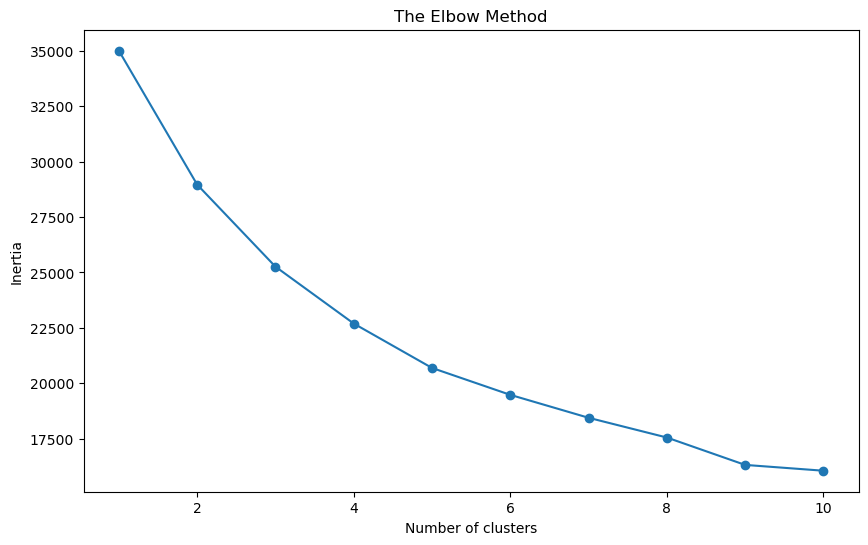

In [40]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Choosing the number of clusters (k) using the Elbow Method
inertia = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, random_state=0)
    kmeans.fit(X_scaled)
    inertia.append(kmeans.inertia_)

plt.figure(figsize=(10, 6))
plt.plot(range(1, 11), inertia, marker='o')
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.show()

In [41]:
k = 3 # Example, replace with the number you find appropriate
kmeans = KMeans(n_clusters=k, random_state=0)
kmeans.fit(X_scaled)

# Cluster labels
labels = kmeans.labels_

# You can add these labels to your original dataframe to see which data points belong to which cluster
combined_matches['cluster'] = labels

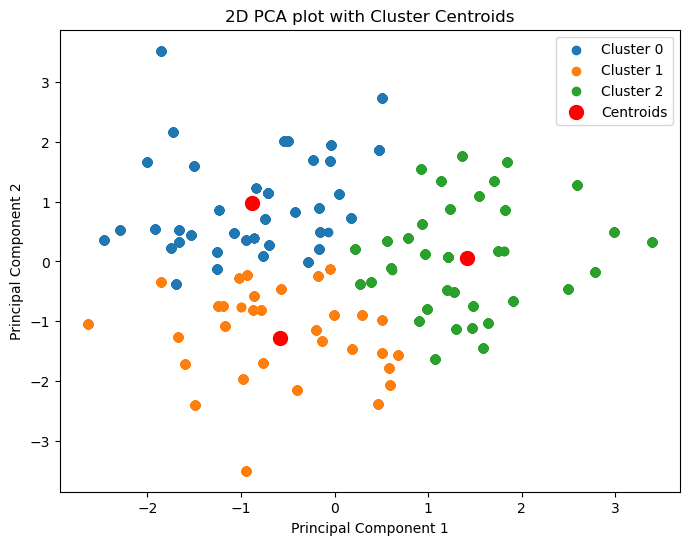

In [42]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np

# Assume that you've already fitted the KMeans model with the optimal number of clusters, k=3
kmeans = KMeans(n_clusters=3, random_state=0)
kmeans.fit(X_scaled)
labels = kmeans.labels_

# Reduce the data to two dimensions using PCA for visualization
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# Plotting the results of PCA
plt.figure(figsize=(8, 6))

# Scatter plot of the data points, colored by cluster label
for i in range(3):
    plt.scatter(X_pca[labels == i, 0], X_pca[labels == i, 1], label=f'Cluster {i}')

# Scatter plot for centroids
centroids = pca.transform(kmeans.cluster_centers_)
plt.scatter(centroids[:, 0], centroids[:, 1], s=100, c='red', label='Centroids')

plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.title('2D PCA plot with Cluster Centroids')
plt.show()

In [43]:
import pandas as pd

# Assuming 'combined_matches' is your original dataframe and
# it now includes a 'cluster' column from the K-Means clustering.

# Group the data by the cluster assignments
clustered_data = combined_matches.groupby('cluster')

# Calculate the mean value for each feature within each cluster
cluster_means = clustered_data.mean()

# If you have a lot of features and want to transpose for better readability
cluster_means = cluster_means.transpose()

print(cluster_means)

cluster                       0             1             2
match_id           7.406087e+09  7.406086e+09  7.406084e+09
match_seq_num      6.234324e+09  6.234324e+09  6.234319e+09
radiant_win        4.688543e-01  5.354707e-01  7.200461e-01
start_time         1.698598e+09  1.698598e+09  1.698598e+09
duration           3.559591e+01  3.656140e+01  3.472699e+01
avg_mmr            4.007625e+03  4.152855e+03  4.133706e+03
num_mmr            2.455241e+00  2.405632e+00  2.325977e+00
lobby_type         7.000000e+00  6.522510e+00  6.201613e+00
game_mode          2.147164e+01  2.138608e+01  2.146371e+01
avg_rank_tier      7.577197e+01  7.479809e+01  7.527247e+01
num_rank_tier      5.325918e+00  5.130286e+00  5.659562e+00
r_carry            3.507786e+00  2.342428e+00  2.993088e+00
r_disabler         2.926585e+00  3.752387e+00  4.453917e+00
r_durable          1.738042e+00  1.666439e+00  2.682604e+00
r_escape           2.373192e+00  1.714870e+00  2.205069e+00
r_initiator        1.695217e+00  1.84311

C:\Users\shakt\AppData\Local\Temp\ipykernel_24852\1770055479.py:10: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  cluster_means = clustered_data.mean()


In [46]:
# Get a summary of statistics for each cluster
cluster_description = clustered_data.describe()
print(cluster_description)

        match_id                                                          \
           count          mean           std           min           25%   
cluster                                                                    
0         1798.0  7.406087e+09  17560.219486  7.406065e+09  7.406073e+09   
1         1466.0  7.406086e+09  15888.767648  7.406065e+09  7.406076e+09   
2         1736.0  7.406084e+09  11798.048357  7.406065e+09  7.406074e+09   

                                                  match_seq_num                \
                  50%           75%           max         count          mean   
cluster                                                                         
0        7.406081e+09  7.406097e+09  7.406139e+09        1798.0  6.234324e+09   
1        7.406081e+09  7.406092e+09  7.406128e+09        1466.0  6.234324e+09   
2        7.406083e+09  7.406092e+09  7.406112e+09        1736.0  6.234319e+09   

         ... diff_escape      diff_disabler             

In [54]:
feature_description = clustered_data['total_r_carry'].describe()
print(feature_description)

          count      mean       std  min  25%  50%  75%  max
cluster                                                     
0        1798.0  3.507786  0.726856  2.0  3.0  3.0  4.0  5.0
1        1466.0  2.342428  0.655822  1.0  2.0  2.0  3.0  4.0
2        1736.0  2.993088  0.753060  2.0  2.0  3.0  3.0  5.0


In [55]:
feature_description1 = clustered_data['total_r_support'].describe()
print(feature_description1)

          count      mean       std  min  25%  50%  75%  max
cluster                                                     
0        1798.0  1.387097  0.832887  0.0  1.0  1.0  2.0  3.0
1        1466.0  2.318554  0.776900  1.0  2.0  2.0  3.0  4.0
2        1736.0  1.670507  0.779984  0.0  1.0  2.0  2.0  3.0


In [56]:
feature_description2 = clustered_data['total_r_nuker'].describe()
print(feature_description2)

          count      mean       std  min  25%  50%  75%  max
cluster                                                     
0        1798.0  3.126808  0.847625  1.0  3.0  3.0  4.0  5.0
1        1466.0  4.180764  0.699633  3.0  4.0  4.0  5.0  5.0
2        1736.0  2.972350  0.944168  1.0  2.0  3.0  4.0  4.0


In [57]:
feature_description3 = clustered_data['total_r_durable'].describe()
print(feature_description3)

          count      mean       std  min  25%  50%  75%  max
cluster                                                     
0        1798.0  1.738042  0.982773  0.0  1.0  2.0  2.0  4.0
1        1466.0  1.666439  0.716404  0.0  1.0  2.0  2.0  3.0
2        1736.0  2.682604  0.852903  1.0  2.0  3.0  3.0  5.0


In [58]:
feature_description4 = clustered_data['total_r_initiator'].describe()
print(feature_description4)

          count      mean       std  min  25%  50%  75%  max
cluster                                                     
0        1798.0  1.695217  0.685723  0.0  1.0  2.0  2.0  3.0
1        1466.0  1.843111  0.927368  0.0  1.0  2.0  3.0  3.0
2        1736.0  3.144009  0.869595  1.0  3.0  3.0  4.0  5.0


In [59]:
feature_description5 = clustered_data['total_r_disabler'].describe()
print(feature_description5)

          count      mean       std  min   25%  50%  75%  max
cluster                                                      
0        1798.0  2.926585  0.691111  2.0  2.25  3.0  3.0  5.0
1        1466.0  3.752387  0.625465  2.0  3.00  4.0  4.0  5.0
2        1736.0  4.453917  0.552862  3.0  4.00  4.0  5.0  5.0


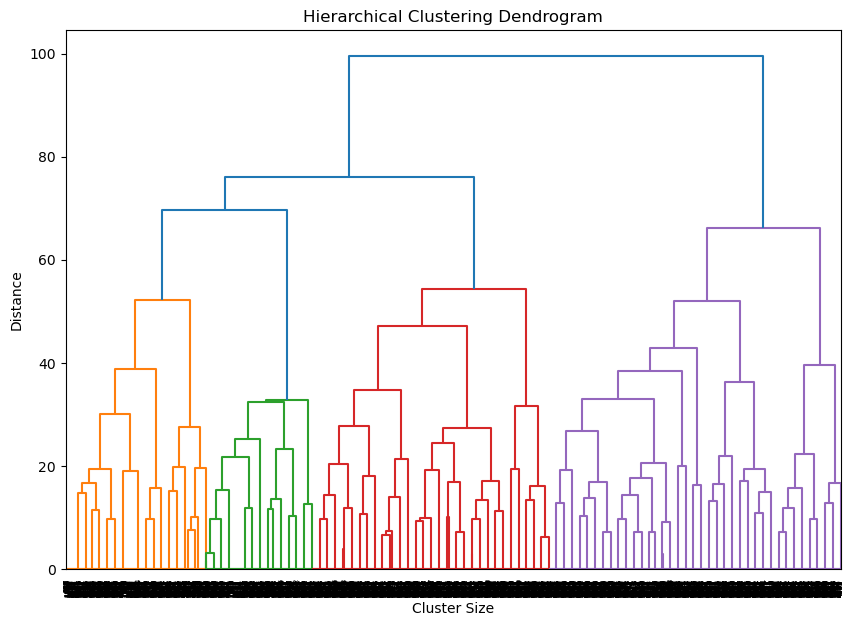

In [60]:
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage
import matplotlib.pyplot as plt

# Assuming X_scaled is your scaled features from earlier steps
# Perform hierarchical clustering
hc = AgglomerativeClustering(affinity='euclidean', linkage='ward')
hc_labels = hc.fit_predict(X_scaled)

# Plot the dendrogram, using 'ward' as the method
linked = linkage(X_scaled, 'ward')
plt.figure(figsize=(10, 7))
dendrogram(linked, orientation='top', distance_sort='descending', show_leaf_counts=True)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Cluster Size')
plt.ylabel('Distance')
plt.show()

In [61]:
import pandas as pd
import numpy as np
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage

# Assuming the existence of 'X_scaled' as your scaled feature set,
# we'll simulate 'X_scaled' with random data for this example.
np.random.seed(0)
X_scaled = np.random.rand(10, 7)  # Simulating 10 samples and 7 features

# Perform hierarchical clustering
hc = AgglomerativeClustering(affinity='euclidean', linkage='ward', n_clusters=None, distance_threshold=0)
hc_labels = hc.fit_predict(X_scaled)

# Convert scaled features to DataFrame for easier manipulation
features_df = pd.DataFrame(X_scaled, columns=['Feature1', 'Feature2', 'Feature3', 'Feature4', 'Feature5', 'Feature6', 'Feature7'])

# Attach the cluster labels to the features dataframe
features_df['Cluster'] = hc_labels

# Define a function to analyze the features within each hierarchical cluster
def analyze_clusters(features_df, hc_labels):
    # Group by cluster label
    grouped = features_df.groupby('Cluster')
    
    # Calculate and print the mean for each cluster
    for cluster, group in grouped:
        print(f'\nCluster {cluster}:')
        print(group.mean())

# Now we can call the function to analyze our clusters
analyze_clusters(features_df, hc_labels)


Cluster 0:
Feature1    0.138183
Feature2    0.196582
Feature3    0.368725
Feature4    0.820993
Feature5    0.097101
Feature6    0.837945
Feature7    0.096098
Cluster     0.000000
dtype: float64

Cluster 1:
Feature1    0.653108
Feature2    0.253292
Feature3    0.466311
Feature4    0.244426
Feature5    0.158970
Feature6    0.110375
Feature7    0.656330
Cluster     1.000000
dtype: float64

Cluster 2:
Feature1    0.617635
Feature2    0.612096
Feature3    0.616934
Feature4    0.943748
Feature5    0.681820
Feature6    0.359508
Feature7    0.437032
Cluster     2.000000
dtype: float64

Cluster 3:
Feature1    0.363711
Feature2    0.570197
Feature3    0.438602
Feature4    0.988374
Feature5    0.102045
Feature6    0.208877
Feature7    0.161310
Cluster     3.000000
dtype: float64

Cluster 4:
Feature1    0.799159
Feature2    0.461479
Feature3    0.780529
Feature4    0.118274
Feature5    0.639921
Feature6    0.143353
Feature7    0.944669
Cluster     4.000000
dtype: float64

Cluster 5:
Feature1    0

In [62]:
import pandas as pd
import numpy as np
from sklearn.cluster import AgglomerativeClustering

# Let's assume 'X_scaled' is your scaled data with proper feature names
# For the purpose of this example, let's create a dummy 'X_scaled' with some example feature names
np.random.seed(0)
X_scaled = np.random.rand(10, 7)  # Simulating 10 samples and 7 features

# Let's assume these are your actual feature names
feature_names = ['diff_carry', 'diff_nuker', 'diff_support', 'diff_durable', 'diff_initiator', 'diff_escape', 'diff_disabler']

# Convert scaled features to DataFrame
features_df = pd.DataFrame(X_scaled, columns=feature_names)

# Perform hierarchical clustering
hc = AgglomerativeClustering(affinity='euclidean', linkage='ward', n_clusters=None, distance_threshold=0)
hc_labels = hc.fit_predict(X_scaled)

# Attach the cluster labels to the features dataframe
features_df['Cluster'] = hc_labels

# Define a function to analyze the features within each hierarchical cluster
def analyze_clusters(features_df, hc_labels):
    # Group by cluster label
    grouped = features_df.groupby('Cluster')
    
    # Calculate and print the mean for each cluster
    for cluster, group in grouped:
        # Exclude the 'Cluster' column when displaying the mean
        cluster_mean = group.iloc[:, :-1].mean()  # Exclude the last column (Cluster)
        print(f'\nCluster {cluster}:')
        print(cluster_mean)

# Now we can call the function to analyze our clusters
analyze_clusters(features_df, hc_labels)


Cluster 0:
diff_carry        0.138183
diff_nuker        0.196582
diff_support      0.368725
diff_durable      0.820993
diff_initiator    0.097101
diff_escape       0.837945
diff_disabler     0.096098
dtype: float64

Cluster 1:
diff_carry        0.653108
diff_nuker        0.253292
diff_support      0.466311
diff_durable      0.244426
diff_initiator    0.158970
diff_escape       0.110375
diff_disabler     0.656330
dtype: float64

Cluster 2:
diff_carry        0.617635
diff_nuker        0.612096
diff_support      0.616934
diff_durable      0.943748
diff_initiator    0.681820
diff_escape       0.359508
diff_disabler     0.437032
dtype: float64

Cluster 3:
diff_carry        0.363711
diff_nuker        0.570197
diff_support      0.438602
diff_durable      0.988374
diff_initiator    0.102045
diff_escape       0.208877
diff_disabler     0.161310
dtype: float64

Cluster 4:
diff_carry        0.799159
diff_nuker        0.461479
diff_support      0.780529
diff_durable      0.118274
diff_initiator  

In [63]:
from sklearn.cluster import AgglomerativeClustering

# We assume that 'X_scaled' is your scaled feature set
# Perform hierarchical clustering with the desired number of clusters
hc = AgglomerativeClustering(n_clusters=4, affinity='euclidean', linkage='ward')
hc_labels = hc.fit_predict(X_scaled)

# Now you have the cluster labels for 4 clusters in hc_labels
# You can attach these labels to your dataframe to examine the clusters
features_df['Cluster'] = hc_labels

# Function to print the cluster content
def print_cluster_content(features_df):
    for cluster in range(4):  # We now have 4 clusters, numbered 0 through 3
        print(f"\nCluster {cluster} contents:")
        print(features_df[features_df['Cluster'] == cluster].mean())  # Print mean of features excluding 'Cluster' label

# Call the function to print the content of each cluster
print_cluster_content(features_df)


Cluster 0 contents:
diff_carry        0.716633
diff_nuker        0.258332
diff_support      0.637869
diff_durable      0.344446
diff_initiator    0.336424
diff_escape       0.127552
diff_disabler     0.638809
Cluster           0.000000
dtype: float64

Cluster 1 contents:
diff_carry        0.686074
diff_nuker        0.763649
diff_support      0.534380
diff_durable      0.760119
diff_initiator    0.544790
diff_escape       0.524482
diff_disabler     0.600072
Cluster           1.000000
dtype: float64

Cluster 2 contents:
diff_carry        0.071036
diff_nuker        0.087129
diff_support      0.020218
diff_durable      0.832620
diff_initiator    0.778157
diff_escape       0.870012
diff_disabler     0.978618
Cluster           2.000000
dtype: float64

Cluster 3 contents:
diff_carry        0.341247
diff_nuker        0.393814
diff_support      0.357294
diff_durable      0.861200
diff_initiator    0.218432
diff_escape       0.538419
diff_disabler     0.092066
Cluster           3.000000
dtype: 